# **Proposta de Trabalho 4 - Mineração de dados**

### **Professor:** Wagner Meira Jr.
### **Aluno:** Gilliard Gabriel Rodrigues
### **Matrícula** 2019054609


### **Tema:** Aprendizado de Máquina Aplicado à Previsão de Preços de Vendas de Casas
### **Base de dados:** https://www.kaggle.com/competitions/house-prices-advanced-regression-techniques/data


In [159]:
#Bibliotecas usadas no projeto
from google.colab import drive #Acesso ao google drive
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import graphviz

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression # Sem regularização
from sklearn.linear_model import Lasso # Com regularização (L1)
from sklearn.linear_model import Ridge # Com regularização (L2)
from sklearn.linear_model import ElasticNetCV # Com regularização (combina L1 com L2) já escolhendo bons hiperparâmetros
from sklearn.tree import DecisionTreeRegressor # Árvore de Decisão
from sklearn.model_selection import GridSearchCV # Para escolher o melhor hiperparâmetro para o modelo
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.tree import plot_tree, export_graphviz

##**2. Data understanding (Entendimento dos dados)**


In [160]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [161]:
pd.options.display.max_columns = None

In [162]:
#Carregando a base de dados
data_path = 'drive/MyDrive/Datasets/'
df = pd.read_csv(data_path + 'ames_housing_dataset.csv', delimiter=',', encoding='utf8')
print(f'O dataset possui {df.shape[0]} linhas e {df.shape[1]} colunas.')
df.head()

O dataset possui 1460 linhas e 81 colunas.


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


Vamos dar uma olhada nos dados:

In [163]:
def visualize_missing_data(df: pd.DataFrame):
    """
    Plota um gráfico de barras com o percentual de valores faltantes nas categorias que possuem valores faltantes.
    Parâmetros:
    ----------
    df : pd.DataFrame
        DataFrame com os dados.
    Retorno:
    -------
    """
    if df.isnull().sum().sum() != 0:
        na_df = (df.isnull().sum() / len(df)) * 100      
        na_df = na_df.drop(na_df[na_df == 0].index).sort_values(ascending=True)
        missing_data = pd.DataFrame({'Percentual de valores faltantes (%)': na_df})
        fig = px.bar(missing_data, x=missing_data['Percentual de valores faltantes (%)'], y=missing_data.index,
                     orientation='h', title='Percentual de valores faltantes por coluna nos dados',
                     labels={"index": "Coluna"}, height=700)
        fig.show()
    else:
        print('Sem valores faltantes no dataframe!')

In [164]:
visualize_missing_data(df)

Limpando os dados:

A primeira política em relação a valores nulos que será adotada é a remoção das colunas que possuem como nulo mais de 50% de seus valores, já que nesses casos a minoria das instâncias de dados possui informação para essas _features_. Em ambos os casos, essas colunas seriam 'PoolQC', 'MiscFeature', 'Alley' e 'Fence'. Embore 'FireplaceQu' possua mais de 50% dos seus valores como nulo apenas nos dados de teste, vamos removê-la também dos dados de treino para não ficar diferente. Também já eliminaremos o id.

In [165]:
df.drop(['Id', 'PoolQC', 'MiscFeature', 'Alley', 'Fence'], axis=1, inplace=True)

Tomando o arquivo _data_description_ (presente no _Kaggle_) como consulta, temos que das 75 _features_ restantes (já desconsiderando o id e a variável _target_, ou seja, _SalePrice_), 39 são categóricas e 36 são numéricas. Vamos separá-las:

In [166]:
categorical_features = ['BldgType', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'BsmtQual', 'CentralAir', 
                        'Condition1', 'Condition2', 'Electrical', 'ExterCond', 'ExterQual', 'Exterior1st', 'Exterior2nd', 
                        'Foundation', 'Functional', 'GarageCond', 'GarageFinish', 'GarageQual', 'GarageType', 'Heating', 
                        'HeatingQC', 'HouseStyle', 'KitchenQual', 'LandContour', 'LandSlope', 'LotConfig', 'LotShape', 
                        'MSZoning', 'MasVnrType', 'Neighborhood', 'PavedDrive', 'RoofMatl', 'RoofStyle', 'SaleCondition', 
                        'SaleType', 'Street', 'Utilities', 'FireplaceQu']
numeric_features = ['1stFlrSF', '2ndFlrSF', '3SsnPorch', 'BedroomAbvGr', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtFullBath', 
                    'BsmtHalfBath', 'BsmtUnfSF', 'EnclosedPorch', 'Fireplaces', 'FullBath', 'GarageArea', 'GarageCars', 
                    'GarageYrBlt', 'GrLivArea', 'HalfBath', 'KitchenAbvGr', 'LotArea', 'LotFrontage', 'LowQualFinSF', 
                    'MSSubClass', 'MasVnrArea', 'MiscVal', 'MoSold', 'OpenPorchSF', 'OverallCond', 'OverallQual', 
                    'PoolArea', 'ScreenPorch', 'TotRmsAbvGrd', 'TotalBsmtSF', 'WoodDeckSF', 'YearBuilt', 'YearRemodAdd', 
                    'YrSold']

Separando as _features_ com valores faltantes em númericas e categóricas, temos:

In [167]:
numeric_with_missing = ['LotFrontage', 'GarageYrBlt', 'MasVnrArea', 'BsmtFinSF2', 'GarageArea', 'GarageCars',
                        'TotalBsmtSF', 'BsmtUnfSF', 'BsmtFinSF1', 'BsmtHalfBath', 'BsmtFullBath'] 
categorical_with_missing = ['GarageCond', 'GarageQual', 'GarageFinish', 'GarageType', 'BsmtFinType2',
                          'BsmtExposure', 'BsmtFinType1', 'BsmtCond', 'BsmtQual', 'MasVnrType', 
                          'Electrical', 'KitchenQual', 'SaleType', 'Exterior1st', 'Exterior2nd', 
                          'Utilities', 'Functional', 'MSZoning', 'FireplaceQu']

No caso das variáveis numéricas, poderíamos substituir os valores faltantes pela média, mas como ela é uma medida sensível a _outliers_, vamos preferir a mediana. No caso das variáveis categóricas, vamos substituir pela moda.

Primeiro, vamos lidar com as numéricas:

In [168]:
numeric_imputer = SimpleImputer(missing_values = np.nan, strategy = 'median')
numeric_imputer = numeric_imputer.fit(df[numeric_with_missing])
df[numeric_with_missing] = numeric_imputer.transform(df[numeric_with_missing])

Em seguida, vamos lidar com as categóricas:

In [169]:
categorical_imputer = SimpleImputer(missing_values = np.nan, strategy = 'most_frequent')
categorical_imputer = categorical_imputer.fit(df[categorical_with_missing])
df[categorical_with_missing] = categorical_imputer.transform(df[categorical_with_missing])

Feito isso, vamos conferir se a base agora se encontra sem valores faltantes:

In [170]:
visualize_missing_data(df)

Sem valores faltantes no dataframe!


Agora vamos para a análise exploratória dos dados.

Primeiro, vamos plotar os boxplots e para cada _feature_ numérica a fim de visualizar os outliers:

In [171]:
def visualize_boxplots_of_numeric_features(df: pd.DataFrame, numeric_features: list):
    """
    Plota um boxplot para cada feature numérica.
    Parâmetros:
    ----------
    df : pd.DataFrame
        DataFrame com os dados.
    numeric_features : list
        Lista com os nomes das features numéricas.
    Retorno:
    -------
    """
    fig, ax = plt.subplots(12,3, figsize=(40,70))
    for index, feature in enumerate(numeric_features):
        i, j = divmod(index, 3)
        sns.boxplot(x=df[feature], ax=ax[i, j])
        ax[i, j].set_xlabel(feature,fontsize=20)
        ax[i, j].tick_params(labelsize=18)
        
def visualize_histograms_of_numeric_features(df: pd.DataFrame, numeric_features: list):
    """
    Plota um histograma para cada feature numérica.
    Parâmetros:
    ----------
    df : pd.DataFrame
        DataFrame com os dados.
    numeric_features : list
        Lista com os nomes das features numéricas.
    Retorno:
    -------
    """
    fig, ax = plt.subplots(12,3, figsize=(40,70))
    for index, feature in enumerate(numeric_features):
        i, j = divmod(index, 3)
        sns.histplot(color='dodgerblue', x=df[feature], kde=True, ax = ax[i, j])
        ax[i, j].set_xlabel(feature,fontsize=20)
        ax[i, j].tick_params(labelsize=18)
def visualize_countplots_of_categorical_features(df: pd.DataFrame, categorical_features: list):
    """
    Plota um countplot para cada feature categórica.
    Parâmetros:
    ----------
    df : pd.DataFrame
        DataFrame com os dados.
    numeric_features : list
        Lista com os nomes das features categóricas.
    Retorno:
    -------
    """
    fig, ax = plt.subplots(13,3, figsize=(40,70))
    for index, feature in enumerate(categorical_features):
        i, j = divmod(index, 3)
        sns.countplot(x=df[feature], color='dodgerblue', ec='k', ax = ax[i, j])
        ax[i, j].set_xlabel(feature,fontsize=20)
        ax[i, j].tick_params(labelsize=18)

def visualize_boxplots_of_categorical_features(df: pd.DataFrame, categorical_features: list, target: str):
    """
    Plota um boxplot para cada feature categórica.
    Parâmetros:
    ----------
    df : pd.DataFrame
        DataFrame com os dados.
    numeric_features : list
        Lista com os nomes das features categóricas.
    target : str
        Nome da variável target.
    Retorno:
    -------
    """
    fig, ax = plt.subplots(13,3, figsize=(40,70))
    for index, feature in enumerate(categorical_features):
        i, j = divmod(index, 3)
        sns.boxplot(x=df[feature], y=df[target], color='dodgerblue', ax = ax[i, j])
        ax[i, j].set_xlabel(feature,fontsize=20)
        ax[i, j].tick_params(labelsize=18)

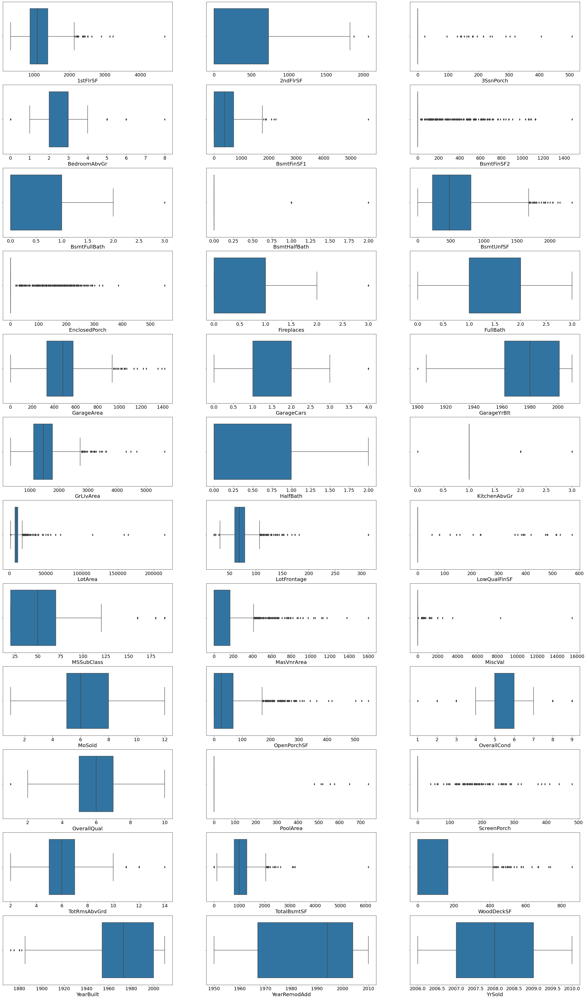

In [172]:
visualize_boxplots_of_numeric_features(df, numeric_features)

De acordo com os boxplots, existem muitos outliers. No entanto, como a maioria das _features_ numéricas dizem respeito a medidas ou distâncias, já é esperado que existam casas com medidas incomuns (principalmente maiores, no caso de casas mais luxuosas). No entanto, devemos nos preocupar com as _features_ que envolvem ano, visto que não pode haver alguma informação nos conjuntos de dados que remeta a um ano que ainda não chegou, por exemplo.

As _features_ que envolvem ano são 'GarageYrBlt', 'YearBuilt', 'YearRemodAdd' e 'YrSold'. Baseado na data de publicação do _Ames Housing dataset_ (utilizado para esse desafio), não podemos ter um ano superior a 2010. Vamos verificar cada _feature_ no conjunto de dados:

In [173]:
print(f"Nº de casos em que GarageYrBlt é > 2010: {df[df['GarageYrBlt'] > 2010].shape[0]}")
print(f"Nº de casos em que YearBuilt é > 2010: {df[df['YearBuilt'] > 2010].shape[0]}")
print(f"Nº de casos em que YearRemodAdd é > 2010: {df[df['YearRemodAdd'] > 2010].shape[0]}")
print(f"Nº de casos em que YrSold é > 2010: {df[df['YrSold'] > 2010].shape[0]}")

Nº de casos em que GarageYrBlt é > 2010: 0
Nº de casos em que YearBuilt é > 2010: 0
Nº de casos em que YearRemodAdd é > 2010: 0
Nº de casos em que YrSold é > 2010: 0


Agora vamos dar uma olhada em como cada feature numérica do treino se relaciona com a variável _target_:

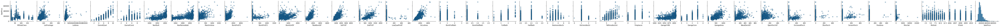

In [174]:
sns.pairplot(df, y_vars=["SalePrice"], plot_kws={'alpha':0.5, 'edgecolor':'k'})
plt.show()

É possível notar uma tendência linear positiva entre algumas _features_ e a _target_, como 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'TotalBsmtSF', 'stFlrSF', 'GrLivArea', 'GarageYrBlt' e 'GarageArea', mas nada bem definido.

Vamos dar uma olhada na distribuição das _features_ numéricas através de histogramas:

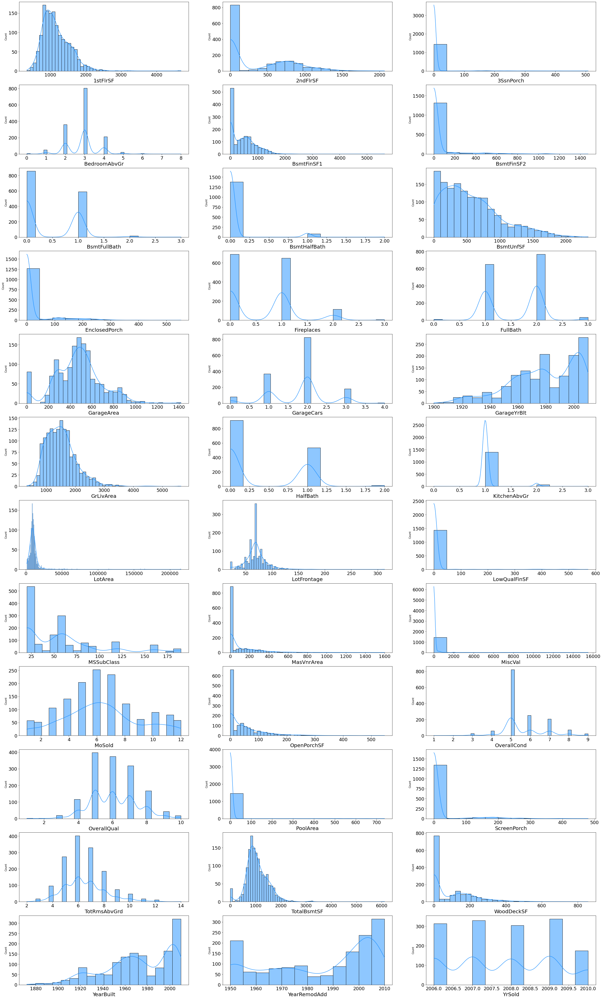

In [175]:
visualize_histograms_of_numeric_features(df, numeric_features)

'1stFlrSF' e 'GrLivArea' são boas candidatas para uma transformação logarítmica. Vamos transformá-las:

In [176]:
def log_transform_data(feature : str):
    df[feature] = np.log1p(df[feature].values)

In [177]:
log_transform_data('1stFlrSF')
log_transform_data('GrLivArea')

Vamos dar uma olhada em como ficaram:

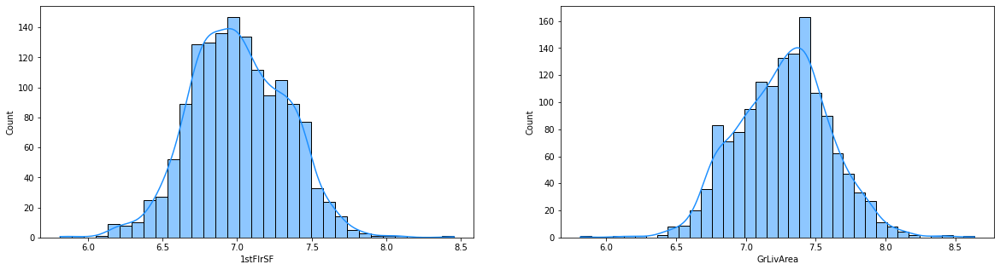

In [178]:
fig, ax = plt.subplots(1,2, figsize=(20,5))

sns.histplot(color='dodgerblue', x=df['1stFlrSF'], kde=True, ax = ax[0])
sns.histplot(color='dodgerblue', x=df['GrLivArea'], kde=True, ax = ax[1])
plt.show()

Como podemos ver, isso deixou as distribuições mais próximas de uma normal.

Agora vamos dar uma olhada nas variáveis categóricas:

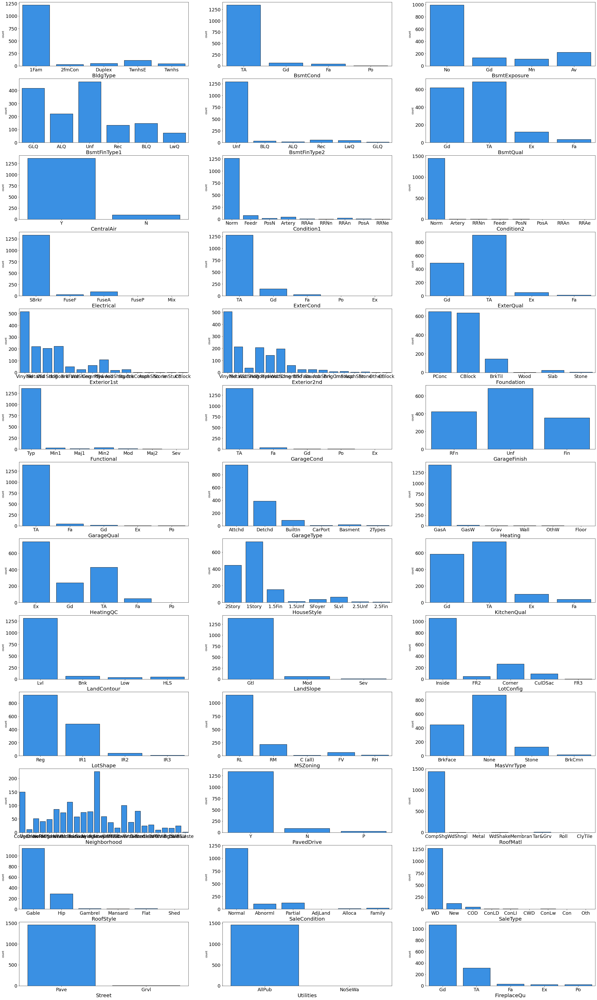

In [179]:
visualize_countplots_of_categorical_features(df, categorical_features)

Através dos gráficos acima é possível notar que as categorias não são muito bem distribuídas, tendo várias características são predominantes nas casas dessa região.

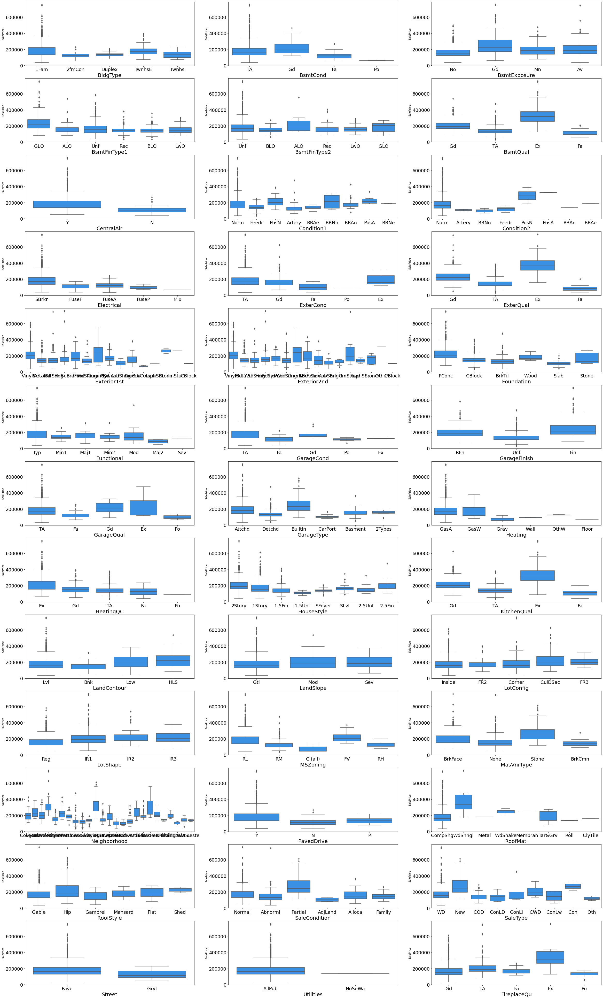

In [180]:
visualize_boxplots_of_categorical_features(df, categorical_features, 'SalePrice')

'BsmtQual' (Altura do porão), 'BsmtCond' (Condição do porão), 'BsmtExposure' (Paredes do porão no nível do jardim ou paralisação), 'Condition1' (Proximidade de estrada principal ou ferrovia), 'Condition2' (Proximidade da estrada principal ou ferrovia, se houver uma segunda), 'ExternQual' (Qualidade do exterior), 'KitchenQual' (Qualidade da cozinha), 'RoofMatl' (Material do telhado), 'SaleType' (Tipo da venda) e 'FireplaceQu' são features que aparentam impactar em preços mais elevados. 'Neighborhood' (Vizinhança) aparenta influenciar bastante no preço.

##**3. Data preparation (Preparação dos dados)**

Vamos converter os dados categóricos em numéricos. Para isso, primeiro vamos separar as variáveis categóricas ordinais:

In [181]:
ordinal_features = ['LotShape', 'LandContour', 'Utilities', 'LandSlope', 'OverallQual', 'OverallCond', 'ExterQual', 
                    'ExterCond', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC',
                    'KitchenQual', 'Functional', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive']

Para as variáveis categóricas ordinais, usaremos o Label Encoder:

In [182]:
le = LabelEncoder()
df[ordinal_features] = df[ordinal_features].apply(le.fit_transform)

Para as demais, faremos o One Hot Encoding:

In [183]:
non_ordinal_features = ['BldgType', 'CentralAir', 'Condition1', 'Condition2', 'Electrical', 'Exterior1st', 
                        'Exterior2nd', 'Foundation', 'GarageType', 'Heating', 'HouseStyle', 'KitchenQual', 
                        'LotConfig', 'MSZoning', 'MasVnrType', 'Neighborhood', 'RoofMatl', 'RoofStyle',
                        'SaleCondition', 'SaleType', 'Street', 'FireplaceQu']

In [186]:
df = pd.get_dummies(df, columns=non_ordinal_features)

Conferindo se não sobrou nenhuma feature categórica:

In [187]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Columns: 219 entries, MSSubClass to FireplaceQu_TA
dtypes: float64(13), int64(41), uint8(165)
memory usage: 851.3 KB


Vamos dar uma olhada nas correlações entre as features:

In [188]:
corr_matrix= df.corr() 

plt.figure(figsize=(250, 250))
sns.heatmap(corr_matrix, annot=True)
plt.show()

Como são muitas variáveis, o heatmap não ficou legível. Dando zoom é possível analisar as correlações, mas vamos dar uma olhada num resumo delas: as maiores positivas e negativas em relação à variável target:

In [189]:
corr_matrix= df.corr()
print(corr_matrix.loc['SalePrice'].sort_values())

ExterQual       -0.636884
BsmtQual        -0.618025
GarageFinish    -0.537242
KitchenQual_3   -0.519298
HeatingQC       -0.400178
                   ...   
GarageArea       0.623431
GarageCars       0.640409
GrLivArea        0.695147
OverallQual      0.790982
SalePrice        1.000000
Name: SalePrice, Length: 219, dtype: float64


Como podemos ver, existem algumas variáveis com correlações altas em relação à target, como 'ExternQual', 'BsmtQual', 'GarageArea', 'GarageCars', 'GrLivArea' e 'OverallQual'.

Vamos separar a variável dependente (target) das variáveis independentes:

In [190]:
X = df.drop('SalePrice', axis=1) # Variáveis features
y = df['SalePrice'] # Variável target

Agora vamos separar os dados em treino e teste:

In [230]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Z-normalizando as colunas do treino:

In [231]:
X_scaler = StandardScaler().fit(X_train)
X_train_standardized = X_scaler.transform(X_train)
X_test_standardized = X_scaler.transform(X_test)

y_scaler = StandardScaler().fit(y_train.values[:, np.newaxis])
y_train_standardized = y_scaler.transform(y_train.values[:, np.newaxis]).ravel()
y_test_standardized = y_scaler.transform(y_test.values[:, np.newaxis]).ravel()

##**4. Modeling (Modelagem)**

Para escolher o modelo, iremos testar as seguintes técnicas: regressão linear sem regularização e com regularização (*Lasso*, *Ridge* e *Elastic Net*), além de árvore de decisão:

In [232]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV

Primeiro vamos construir os modelos:

In [233]:
lm = LinearRegression(fit_intercept=False)

lasso = GridSearchCV(Lasso(fit_intercept=False), # Procura os melhores parâmetros no modelo Lasso
                     cv=5, # Fazendo validação cruzada de 5 dobras
                     refit=True, # Após achar os melhores parâmetros, retorna o modelo já treinado
                     param_grid={'alpha':[0.001, 0.01, 0.1, 1, 10, 100]})  # Procura a regularização com parâmetros nessa faixa

ridge = GridSearchCV(Ridge(fit_intercept=False),
                     cv=5,
                     refit=True,
                     param_grid={'alpha':[0.001, 0.01, 0.1, 1, 10, 100]})

elastic_net = ElasticNetCV(fit_intercept=False,
                          l1_ratio=[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1],
                          alphas=[0.001, 0.01, 0.1, 1, 10, 100],
                          cv=5)

tree_params = [{'criterion': ['squared_error', 'friedman_mse', 'absolute_error'], 
                'max_depth': range(1, 21)}]
d_tree = GridSearchCV(DecisionTreeRegressor(random_state=42),
                     tree_params,
                     cv=5,
                     refit=True)

Agora vamos treiná-los com nossos dados de treino:

In [234]:
lm = lm.fit(X_train_standardized, y_train_standardized)
print('R² da regressão linear sem regularização: {0}'.format(lm.score(X_train_standardized, y_train_standardized)))
lasso = lasso.fit(X_train_standardized, y_train_standardized)
print('R² da regressão linear com regularização Lasso: {0}'.format(lasso.score(X_train_standardized, y_train_standardized)))
ridge = ridge.fit(X_train_standardized, y_train_standardized)
print('R² da regressão linear com regularização Ridge: {0}'.format(ridge.score(X_train_standardized, y_train_standardized)))
elastic_net = elastic_net.fit(X_train_standardized, y_train_standardized)
print('R² da regressão linear com regularização ElasticNet: {0}'.format(elastic_net.score(X_train_standardized, y_train_standardized)))
d_tree = d_tree.fit(X_train_standardized, y_train_standardized)
print('R² da regressão linear com árvore de decisão: {0}'.format(d_tree.score(X_train_standardized, y_train_standardized)))


R² da regressão linear sem regularização: 0.9231110460984442
R² da regressão linear com regularização Lasso: 0.9107299219921798
R² da regressão linear com regularização Ridge: 0.9182357778699183
R² da regressão linear com regularização ElasticNet: 0.9053454162793518
R² da regressão linear com árvore de decisão: 0.9109928786798992


Como podemos ver, a regressão linear sem regularização foi a que obteve um maior *score* R² e a árvore de decisão obteve o pior. Agora vamos dar uma olhada nos erros quadrados médios:

In [235]:
from sklearn.metrics import mean_squared_error, r2_score

lm_mse = mean_squared_error(y_train_standardized, lm.predict(X_train_standardized))
print('Erro quadrado médio da regressão linear sem regularização: {0}'.format(lm_mse))
lasso_mse = mean_squared_error(y_train_standardized, lasso.predict(X_train_standardized))
print('Erro quadrado médio da regressão linear com regularização Lasso: {0}'.format(lasso_mse))
ridge_mse = mean_squared_error(y_train_standardized, ridge.predict(X_train_standardized))
print('Erro quadrado médio da regressão linear com regularização Ridge: {0}'.format(ridge_mse))
elastic_net_mse = mean_squared_error(y_train_standardized, elastic_net.predict(X_train_standardized))
print('Erro quadrado médio da regressão linear com regularização Elastic Net: {0}'.format(elastic_net_mse))
d_tree_mse = mean_squared_error(y_train_standardized, d_tree.predict(X_train_standardized))
print('Erro quadrado médio da árvore de decisão: {0}'.format(d_tree_mse))

Erro quadrado médio da regressão linear sem regularização: 0.07688895390155583
Erro quadrado médio da regressão linear com regularização Lasso: 0.0892700780078202
Erro quadrado médio da regressão linear com regularização Ridge: 0.08176422213008178
Erro quadrado médio da regressão linear com regularização Elastic Net: 0.09465458372064825
Erro quadrado médio da árvore de decisão: 0.08900712132010087


Como podemos ver, os erros quadrados médios são relativamente próximos, mas o da árvore de decisão ainda é o maior e o da regressão linear sem regularização, o menor.

A fim de comparar os 5 modelos, vamos implementar duas funções: uma que faça um bootstrap dos erros quadrados médios de um modelo e outra que faz o mesmo sobre o R²:

In [236]:
def bootstrap_mse(X, y, model, n=10000):
    size = len(y)
    errors = np.zeros(size)
    for i in range(size):
        # Gera amostras com reposição:
        id_x = np.random.choice(size, size)
        Xb = X[id_x]
        yb = y[id_x]
        mse = mean_squared_error(yb, model.predict(Xb)) # Calcula o erro quadrado médio da amostra
        errors[i] = mse # Armazena no array
    return errors

def bootstrap_r2(X, y, model, n=10000):
    size = len(y)
    Rs = np.zeros(size)
    for i in range(size):
        # Gera amostras com reposição:
        id_x = np.random.choice(size, size)
        Xb = X[id_x]
        yb = y[id_x]
        r2 = r2_score(yb, model.predict(Xb)) # Calcula o R²
        Rs[i] = r2 # Armazena no array
    return Rs

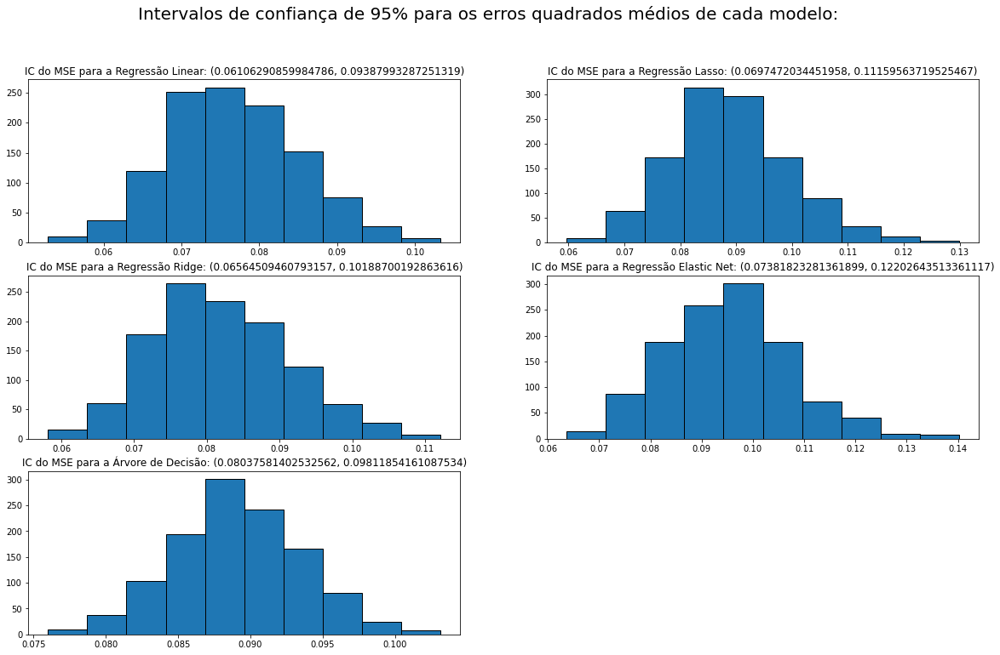

In [237]:
plt.figure(figsize=(20,12))
plt.suptitle("Intervalos de confiança de 95% para os erros quadrados médios de cada modelo:", fontsize=20)

samples = bootstrap_mse(X_train_standardized, y_train_standardized, lm)
plt.subplot(321)
plt.hist(samples, ec='k')
plt.title('IC do MSE para a Regressão Linear: ({}, {})'.format(np.percentile(samples, 2.5), np.percentile(samples, 97.5)))

samples = bootstrap_mse(X_train_standardized, y_train_standardized, lasso)
plt.subplot(322)
plt.hist(samples, ec='k')
plt.title('IC do MSE para a Regressão Lasso: ({}, {})'.format(np.percentile(samples, 2.5), np.percentile(samples, 97.5)))

samples = bootstrap_mse(X_train_standardized, y_train_standardized, ridge)
plt.subplot(323)
plt.hist(samples, ec='k')
plt.title('IC do MSE para a Regressão Ridge: ({}, {})'.format(np.percentile(samples, 2.5), np.percentile(samples, 97.5)))

samples = bootstrap_mse(X_train_standardized, y_train_standardized, elastic_net)
plt.subplot(324)
plt.hist(samples, ec='k')
plt.title('IC do MSE para a Regressão Elastic Net: ({}, {})'.format(np.percentile(samples, 2.5), np.percentile(samples, 97.5)))

samples = bootstrap_mse(X_train_standardized, y_train_standardized, d_tree)
plt.subplot(325)
plt.hist(samples, ec='k')
plt.title('IC do MSE para a Árvore de Decisão: ({}, {})'.format(np.percentile(samples, 2.5), np.percentile(samples, 97.5)))

plt.show()

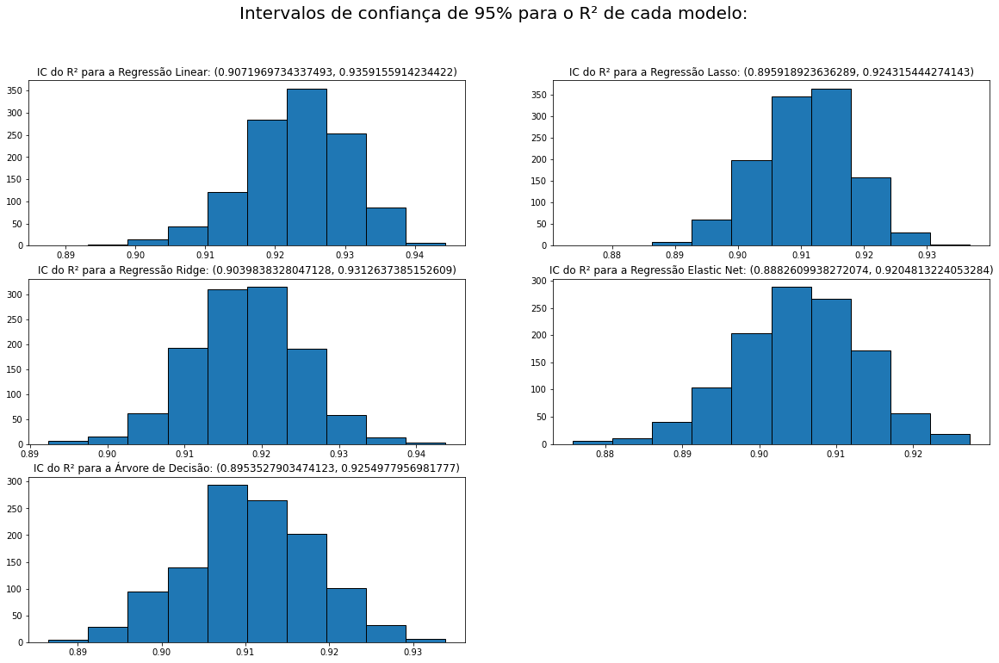

In [238]:
plt.figure(figsize=(20,12))
plt.suptitle("Intervalos de confiança de 95% para o R² de cada modelo:", fontsize=20)

samples = bootstrap_r2(X_train_standardized, y_train_standardized, lm)
plt.subplot(321)
plt.hist(samples, ec='k')
plt.title('IC do R² para a Regressão Linear: ({}, {})'.format(np.percentile(samples, 2.5), np.percentile(samples, 97.5)))

samples = bootstrap_r2(X_train_standardized, y_train_standardized, lasso)
plt.subplot(322)
plt.hist(samples, ec='k')
plt.title('IC do R² para a Regressão Lasso: ({}, {})'.format(np.percentile(samples, 2.5), np.percentile(samples, 97.5)))

samples = bootstrap_r2(X_train_standardized, y_train_standardized, ridge)
plt.subplot(323)
plt.hist(samples, ec='k')
plt.title('IC do R² para a Regressão Ridge: ({}, {})'.format(np.percentile(samples, 2.5), np.percentile(samples, 97.5)))

samples = bootstrap_r2(X_train_standardized, y_train_standardized, elastic_net)
plt.subplot(324)
plt.hist(samples, ec='k')
plt.title('IC do R² para a Regressão Elastic Net: ({}, {})'.format(np.percentile(samples, 2.5), np.percentile(samples, 97.5)))

samples = bootstrap_r2(X_train_standardized, y_train_standardized, d_tree)
plt.subplot(325)
plt.hist(samples, ec='k')
plt.title('IC do R² para a Árvore de Decisão: ({}, {})'.format(np.percentile(samples, 2.5), np.percentile(samples, 97.5)))

plt.show()

Como podemos ver, os 5 intervalos de confiança possuem sobreposição, o que mostram que nesse caso os erros e os coeficientes de determinação dos 5 modelos são estatisticamente equivalentes, ou seja, escolher qualquer um dos modelos não faz diferença significativa.

Apesar de não haver um modelo muito superior aos demais, vamos escolher a regressão linear com regularização Ridge para mensurar os erros no teste, pois seu fator de penalização pode ser uma importante ferramenta contra a multicolinearidade dos dados.

##**5. Evaluation (Validação)**


In [242]:
y_predict = ridge.predict(X_test_standardized)

Vamos plotar o histograma da distribuição dos erros quadrados médios e do R² para o teste, usando o bootstrap:

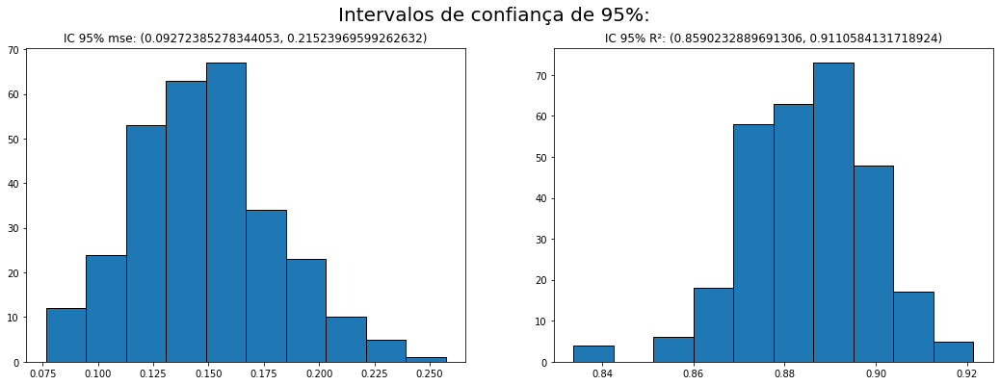

In [243]:
plt.figure(figsize=(18,6))
plt.suptitle("Intervalos de confiança de 95%:", fontsize=20)
plt.subplot(121)
samples = bootstrap_mse(X_test_standardized, y_test_standardized, ridge)
plt.hist(samples, ec='k')
plt.title('IC 95% mse: ({}, {})'.format(np.percentile(samples, 2.5), np.percentile(samples, 97.5)))
plt.subplot(122)
samples = bootstrap_r2(X_test_standardized, y_test_standardized, ridge)
plt.hist(samples, ec='k')
plt.title('IC 95% R²: ({}, {})'.format(np.percentile(samples, 2.5), np.percentile(samples, 97.5)))
plt.show()

Como podemos ver, o intervalo de confiança para o erro quadrado médio do teste aumentou um pouco em relação ao do treino. Isso ocorreu pelo fato de que trata-se dos dados de teste, que ficaram ocultos durante o treino e são usados para simular uma base real.

Vamos dar uma olhada no coeficiente de determinação do modelo (R²):

In [244]:
from sklearn.metrics import r2_score
r2 = r2_score(y_test_standardized, y_predict)
print("Coeficiente de determinação (R²): " + str(r2))

Coeficiente de determinação (R²): 0.8846029068717918


Como podemos ver, o R² também diminuiu, pelos mesmos motivos.

Vamos plotar um gráfico de dispersão comparando o valor esperado e o valor previsto:

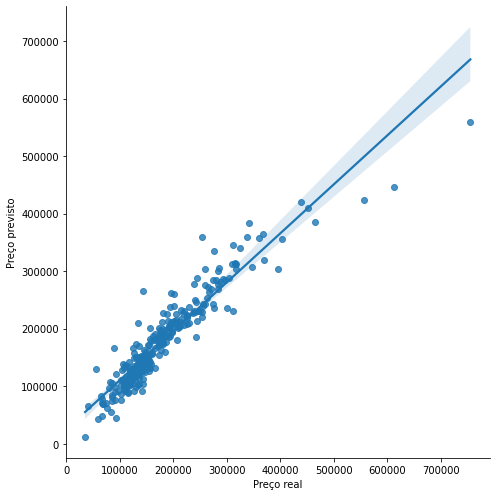

In [262]:
df_to_plot = pd.DataFrame(y_scaler.inverse_transform(y_test_standardized.reshape(-1, 1)), columns=['Preço real'])
df_to_plot['Preço previsto'] = y_scaler.inverse_transform(y_predict.reshape(-1, 1))
sns.lmplot(height=7, x='Preço real', y='Preço previsto', data=df_to_plot, ci=95, n_boot=10000)
plt.show()

**Conclusão**: no fim o modelo conseguiu performar bem na tarefa de prever os preços de venda das residências, alcançando um R² de 88,46% e um erro quadrado médio baixo.